## Fine-tuning Stable Diffusion XL with DreamBooth and LoRA on a free-tier Colab Notebook 🧨

In this notebook, we show how to fine-tune [Stable Diffusion XL (SDXL)](https://huggingface.co/docs/diffusers/main/en/api/pipelines/stable_diffusion/stable_diffusion_xl) with [DreamBooth](https://huggingface.co/docs/diffusers/main/en/training/dreambooth) and [LoRA](https://huggingface.co/docs/diffusers/main/en/training/lora) on a T4 GPU.

SDXL consists of a much larger UNet and two text encoders that make the cross-attention context quite larger than the previous variants.

So, to pull this off, we will make use of several tricks such as gradient checkpointing, mixed-precision, and 8-bit Adam. So, hang tight and let's get started 🧪

## Setup 🪓

In [17]:
# Check the GPU
!nvidia-smi

Sun Jun 23 22:25:11 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   43C    P8              10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [18]:
# Install dependencies.
!pip install bitsandbytes transformers accelerate peft -q

Make sure to install `diffusers` from `main`.

In [19]:
!pip install git+https://github.com/huggingface/diffusers.git -q

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


Download diffusers SDXL DreamBooth training script.

In [20]:
!wget https://raw.githubusercontent.com/huggingface/diffusers/main/examples/dreambooth/train_dreambooth_lora_sdxl.py

--2024-06-23 22:25:49--  https://raw.githubusercontent.com/huggingface/diffusers/main/examples/dreambooth/train_dreambooth_lora_sdxl.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 84303 (82K) [text/plain]
Saving to: ‘train_dreambooth_lora_sdxl.py.1’

train_dreambooth_lo 100%[===================>]  82.33K  --.-KB/s    in 0.01s   

2024-06-23 22:25:49 (5.77 MB/s) - ‘train_dreambooth_lora_sdxl.py.1’ saved [84303/84303]



## Dataset 🐶

**Let's get our training data!**
For this example, we'll download some images from the hub

If you already have a dataset on the hub you wish to use, you can skip this part and go straight to: "Prep for
training 💻" section, where you'll simply specify the dataset name.

If your images are saved locally, and/or you want to add BLIP generated captions,
pick option 1 or 2 below.



**Option 1:** upload example images from your local files:

In [ ]:
# import os
# from google.colab import files

# # pick a name for the image folder
# local_dir = "./dog/" #@param
# os.makedirs(local_dir)
# os.chdir(local_dir)

# # choose and upload local images into the newly created directory
# uploaded_images = files.upload()
# os.chdir("/content") # back to parent directory

**Option 2:** download example images from the hub:

In [ ]:
# from huggingface_hub import snapshot_download

# local_dir = "./dog/"
# snapshot_download(
#     "diffusers/dog-example",
#     local_dir=local_dir, repo_type="dataset",
#     ignore_patterns=".gitattributes",
# )

In [ ]:
# upload the home depot dataset
local_dir='/kaggle/input/revised-data'

In [ ]:
local_dir

'/kaggle/input/revised-data'

Preview the images:

In [25]:
from PIL import Image

def image_grid(imgs, rows, cols, resize=256):

    if resize is not None:
        imgs = [img.resize((resize, resize)) for img in imgs]
    w, h = imgs[0].size
    grid = Image.new("RGB", size=(cols * w, rows * h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i % cols * w, i // cols * h))
    return grid

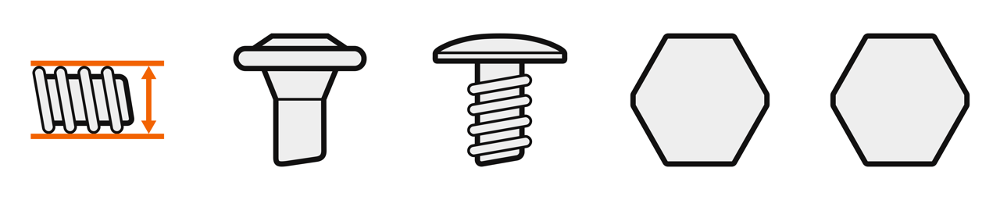

In [26]:
import glob

# change path to display images from your local dir
img_paths = "/content/images/*.png"
imgs = [Image.open(path) for path in glob.glob(img_paths)]

num_imgs_to_preview = 5
image_grid(imgs[:num_imgs_to_preview], 1, num_imgs_to_preview)

In [27]:
import glob
from PIL import Image

# Define the directory containing images
local_dir = "/content/images/"

# Create a list of (path, PIL.Image) pairs
imgs_and_paths = [(path, Image.open(path)) for path in glob.glob(f"{local_dir}*.png")]


In [11]:
imgs_and_paths

[('/content/images/hardware-fasteners-screws-562860-size-562860-screw-size--v1.png',
  <PIL.PngImagePlugin.PngImageFile image mode=RGB size=3000x3000>),
 ('/content/images/hardware-fasteners-screws-562860-head-style-587571-wafer-head-4295189324-v1.png',
  <PIL.PngImagePlugin.PngImageFile image mode=RGB size=3000x3000>),
 ('/content/images/hardware-fasteners-screws-562860-head-style-587571-truss-head-4295189302-v1.png',
  <PIL.PngImagePlugin.PngImageFile image mode=RGB size=3000x3000>),
 ('/content/images/hardware-fasteners-screws-562860-drive-style-5295328677-external-hex-4296094345-v1.png',
  <PIL.PngImagePlugin.PngImageFile image mode=RGB size=3000x3000>),
 ('/content/images/hardware-fasteners-screws-562860-drive-style-5295328677-hex-4296094521-v1.png',
  <PIL.PngImagePlugin.PngImageFile image mode=RGB size=3000x3000>),
 ('/content/images/hardware-fasteners-screws-562861-head-style--serrated-flange-hex--v1.png',
  <PIL.PngImagePlugin.PngImageFile image mode=RGB size=3000x3000>),
 ('/

Now let's add the concept token identifier (e.g. TOK) to each caption using a caption prefix.
Feel free to change the prefix according to the concept you're training on!
- for this example we can use "a photo of TOK," other options include:
    - For styles - "In the style of TOK"
    - For faces - "photo of a TOK person"
- You can add additional identifiers to the prefix that can help steer the model in the right direction.
-- e.g. for this example, instead of "a photo of TOK" we can use "a photo of TOK dog" / "a photo of TOK corgi dog"

don't need to run following code cell, since I already got meatdata.json and upload it

## Prep for training 💻

Download metadata.jsonl, revise the prompt in this file. And delete the orginal screws dataset. Please put metadata.jsonl in the orignal screws icon dataset file, name it as screwsss and upload it to kaggle. We will use the new dataset screwsss for training.

Initialize `accelerate`:

In [28]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

!accelerate config default

Configuration already exists at /root/.cache/huggingface/accelerate/default_config.yaml, will not override. Run `accelerate config` manually or pass a different `save_location`.


### Log into your Hugging Face account
Pass [your **write** access token](https://huggingface.co/settings/tokens) so that we can push the trained checkpoints to the Hugging Face Hub:

In [29]:
from huggingface_hub import notebook_login
notebook_login()

## Train! 🔬

#### Set Hyperparameters ⚡
To ensure we can DreamBooth with LoRA on a heavy pipeline like Stable Diffusion XL, we're using:

* Gradient checkpointing (`--gradient_accumulation_steps`)
* 8-bit Adam (`--use_8bit_adam`)
* Mixed-precision training (`--mixed-precision="fp16"`)

### Launch training 🚀🚀🚀

To allow for custom captions we need to install the `datasets` library, you can skip that if you want to train solely
 with `--instance_prompt`.
In that case, specify `--instance_data_dir` instead of `--dataset_name`

In [30]:
!pip install datasets -q

 - Use `--output_dir` to specify your LoRA model repository name!
 - Use `--caption_column` to specify name of the cpation column in your dataset. In this example we used "prompt" to
 save our captions in the
 metadata file, change this according to your needs.

Approach 1: Without Using Class Images:

Advantage: This approach simplifies the dataset preparation and training process since it only requires instance images. It can be more straightforward if you want to focus solely on generating images of various screw types without the need for general class images.

Disadvantage: The model might overfit to the specific screw types in your instance dataset, potentially losing some generalization capability.

In [31]:
#!/usr/bin/env bash
!accelerate launch train_dreambooth_lora_sdxl.py \
  --pretrained_model_name_or_path="stabilityai/stable-diffusion-xl-base-1.0" \
  --pretrained_vae_model_name_or_path="madebyollin/sdxl-vae-fp16-fix" \
  --dataset_name="/content/images" \
  --output_dir="/content/images/output" \
  --caption_column="text"\
  --mixed_precision="fp16" \
  --instance_prompt="a screw icon" \
  --resolution=128 \
  --train_batch_size=1 \
  --gradient_accumulation_steps=3 \
  --gradient_checkpointing \
  --learning_rate=1e-4 \
  --snr_gamma=5.0 \
  --lr_scheduler="constant" \
  --lr_warmup_steps=0 \
  --mixed_precision="fp16" \
  --use_8bit_adam \
  --max_train_steps=400 \
  --checkpointing_steps=717 \
  --seed="0"

/usr/local/lib/python3.10/dist-packages/diffusers/models/transformers/transformer_2d.py:34: FutureWarning: `Transformer2DModelOutput` is deprecated and will be removed in version 1.0.0. Importing `Transformer2DModelOutput` from `diffusers.models.transformer_2d` is deprecated and this will be removed in a future version. Please use `from diffusers.models.modeling_outputs import Transformer2DModelOutput`, instead.
  deprecate("Transformer2DModelOutput", "1.0.0", deprecation_message)
2024-06-23 22:44:16.894212: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-23 22:44:16.894271: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-23 22:44:17.013560: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] 

### Save your model to the hub and check it out 🔥

In [ ]:
from huggingface_hub import whoami
from pathlib import Path
#@markdown make sure the `output_dir` you specify here is the same as the one used for training
output_dir = "/kaggle/working/output" #@param
username = whoami(token=Path("/root/.cache/huggingface/"))["name"]
repo_id = f"{username}/{'3d-icon-sdxl-lora-4'}"

In [ ]:
repo_id

'jiangqin/3d-icon-sdxl-lora-4'

In [ ]:
# # @markdown Sometimes training finishes succesfuly (i.e. a **.safetensores** file with the LoRA weights saved properly to your local `output_dir`) but there's not enough RAM in the free tier to push the model to the hub 🙁
# # @markdown
# # @markdown To mitigate this, run this cell with your training arguments to make sure your model is uploaded! 🤗

# # push to the hub🔥
# from train_dreambooth_lora_sdxl import save_model_card
# from huggingface_hub import upload_folder, create_repo

# repo_id = create_repo(repo_id, exist_ok=True).repo_id

# # change the params below according to your training arguments
# save_model_card(
#     repo_id = repo_id,
#     images=[],
#     base_model="stabilityai/stable-diffusion-xl-base-1.0",
#     train_text_encoder=False,
#     instance_prompt="a photo of TOK screw icon",
#     validation_prompt=None,
#     repo_folder=output_dir,
#     vae_path="madebyollin/sdxl-vae-fp16-fix",
#     use_dora=True  # Add the missing argument
# )

# upload_folder(
#     repo_id=repo_id,
#     folder_path=output_dir,
#     commit_message="End of training",
#     ignore_patterns=["step_*", "epoch_*"],
# )

In [ ]:
# from IPython.display import display, Markdown

# link_to_model = f"https://huggingface.co/{repo_id}"
# display(Markdown("### Your model has finished training.\nAccess it here: {}".format(link_to_model)))

Let's generate some images with it!

## Inference 🐕

In [32]:
!pip install torch torchvision -q

In [33]:
pip install torch --upgrade


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 779.1/779.1 MB 1.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 168.1/168.1 MB 2.9 MB/s eta 0:00:00
  Attempting uninstall: triton
    Found existing installation: triton 2.3.0
    Uninstalling triton-2.3.0:
      Successfully uninstalled triton-2.3.0
  Attempting uninstall: torch
    Found existing installation: torch 2.3.0+cu121
    Uninstalling torch-2.3.0+cu121:
      Successfully uninstalled torch-2.3.0+cu121
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchaudio 2.3.0+cu121 requires torch==2.3.0, but you have torch 2.3.1 which is incompatible.
torchvision 0.18.0+cu121 requires torch==2.3.0, but you have torch 2.3.1 which is incompatible.


Use Google colab to do inference, upload all the trained weight files to content file.

In [1]:
import torch
from diffusers import DiffusionPipeline, AutoencoderKL

# Load the VAE model
vae = AutoencoderKL.from_pretrained("madebyollin/sdxl-vae-fp16-fix", torch_dtype=torch.float16)

# Load the pipeline
pipe = DiffusionPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    vae=vae,
    torch_dtype=torch.float16,
    variant="fp16",
    use_safetensors=True
)

# upload the pipeline to content, and load LoRA weights from the it
pipe.load_lora_weights("/content/images/output/pytorch_lora_weights.safetensors")



/usr/local/lib/python3.10/dist-packages/diffusers/models/transformers/transformer_2d.py:34: FutureWarning: `Transformer2DModelOutput` is deprecated and will be removed in version 1.0.0. Importing `Transformer2DModelOutput` from `diffusers.models.transformer_2d` is deprecated and this will be removed in a future version. Please use `from diffusers.models.modeling_outputs import Transformer2DModelOutput`, instead.
  deprecate("Transformer2DModelOutput", "1.0.0", deprecation_message)
/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.w

Fetching 17 files:   0%|          | 0/17 [00:00<?, ?it/s]

model.fp16.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/5.14G [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

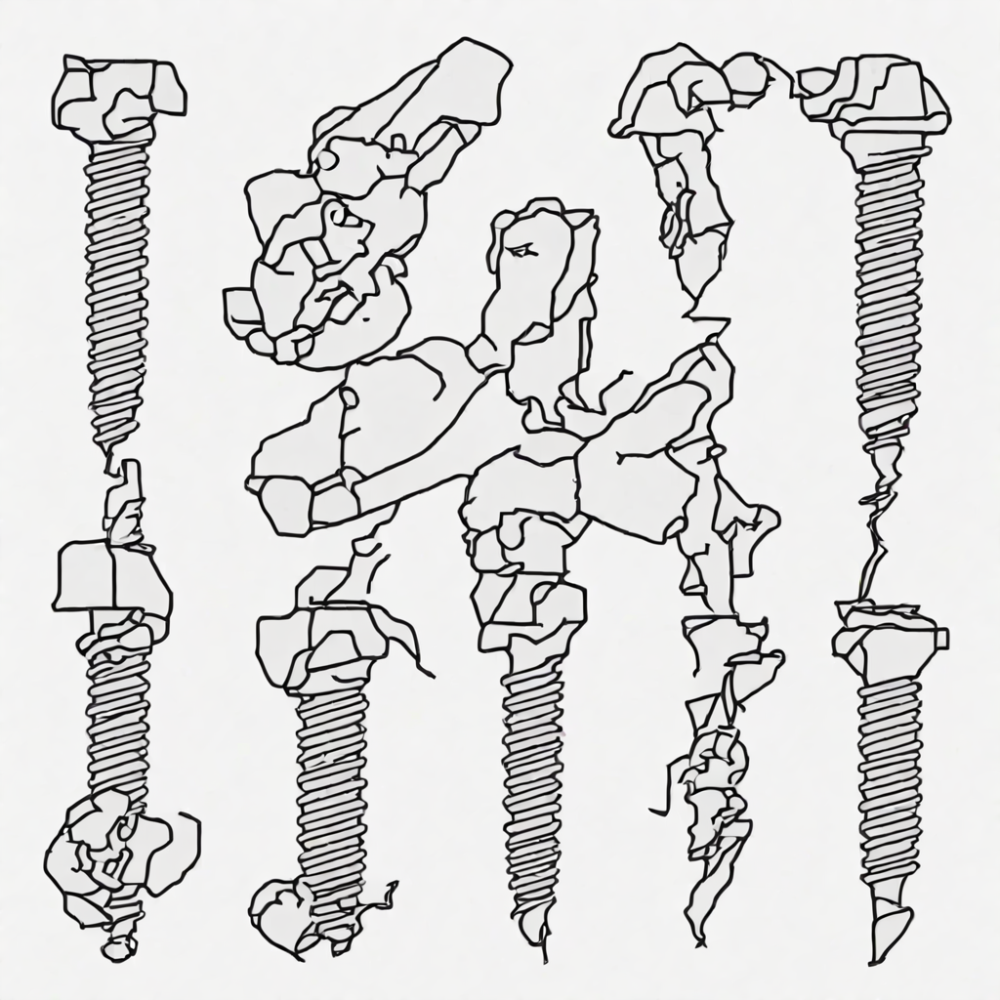

steps: 10 None


  0%|          | 0/20 [00:00<?, ?it/s]

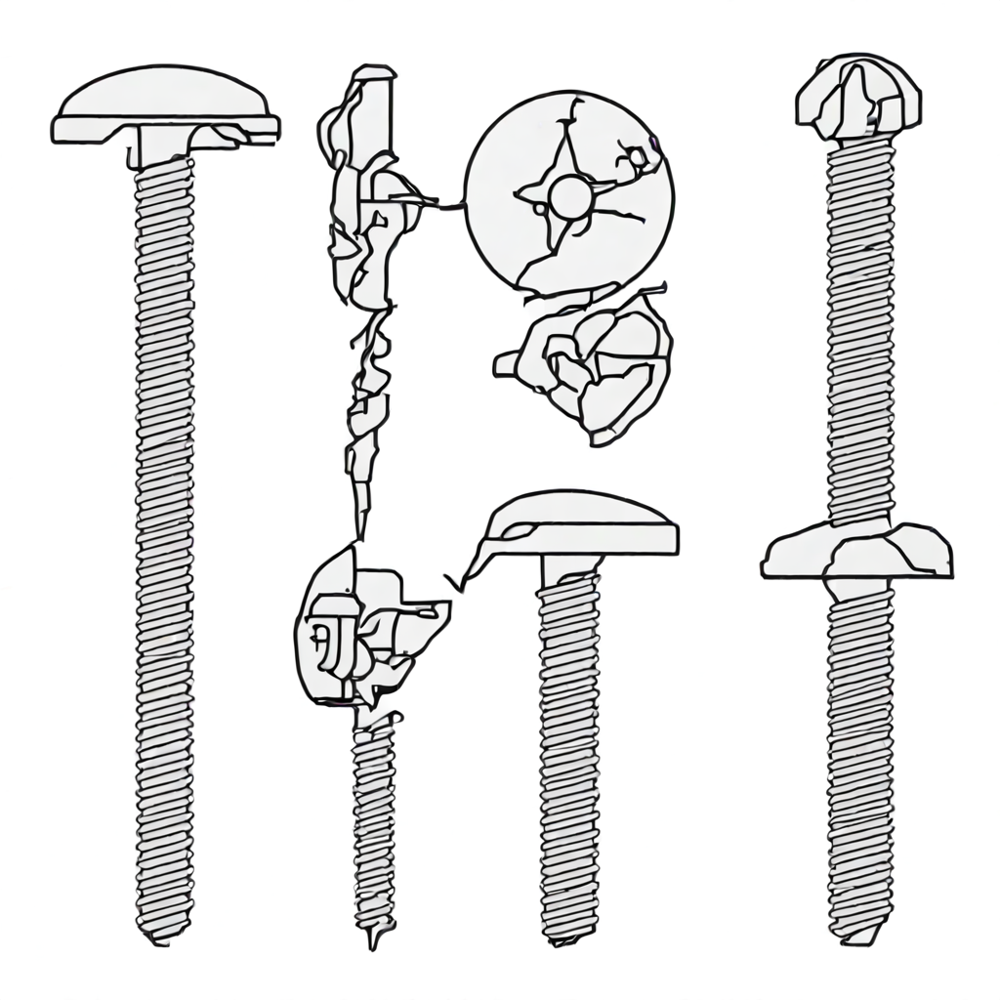

steps: 20 None


  0%|          | 0/60 [00:00<?, ?it/s]

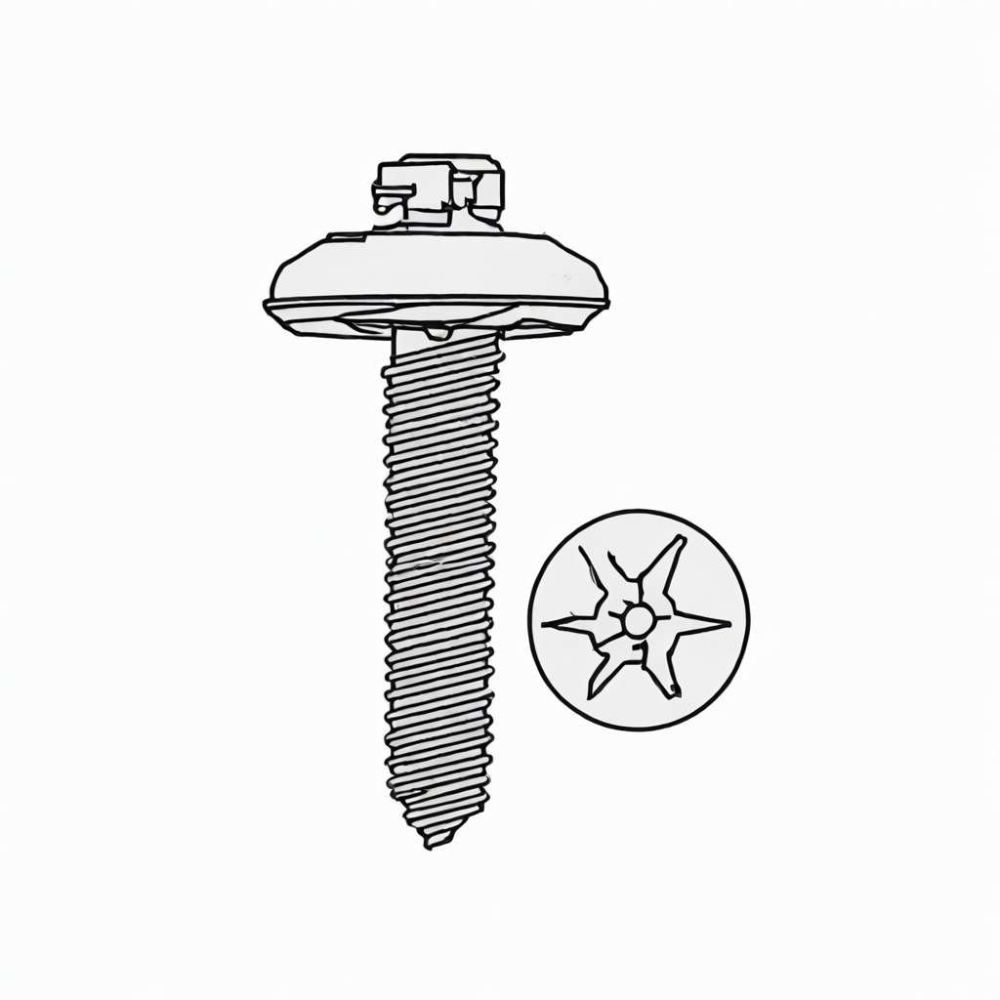

steps: 60 None


  0%|          | 0/100 [00:00<?, ?it/s]

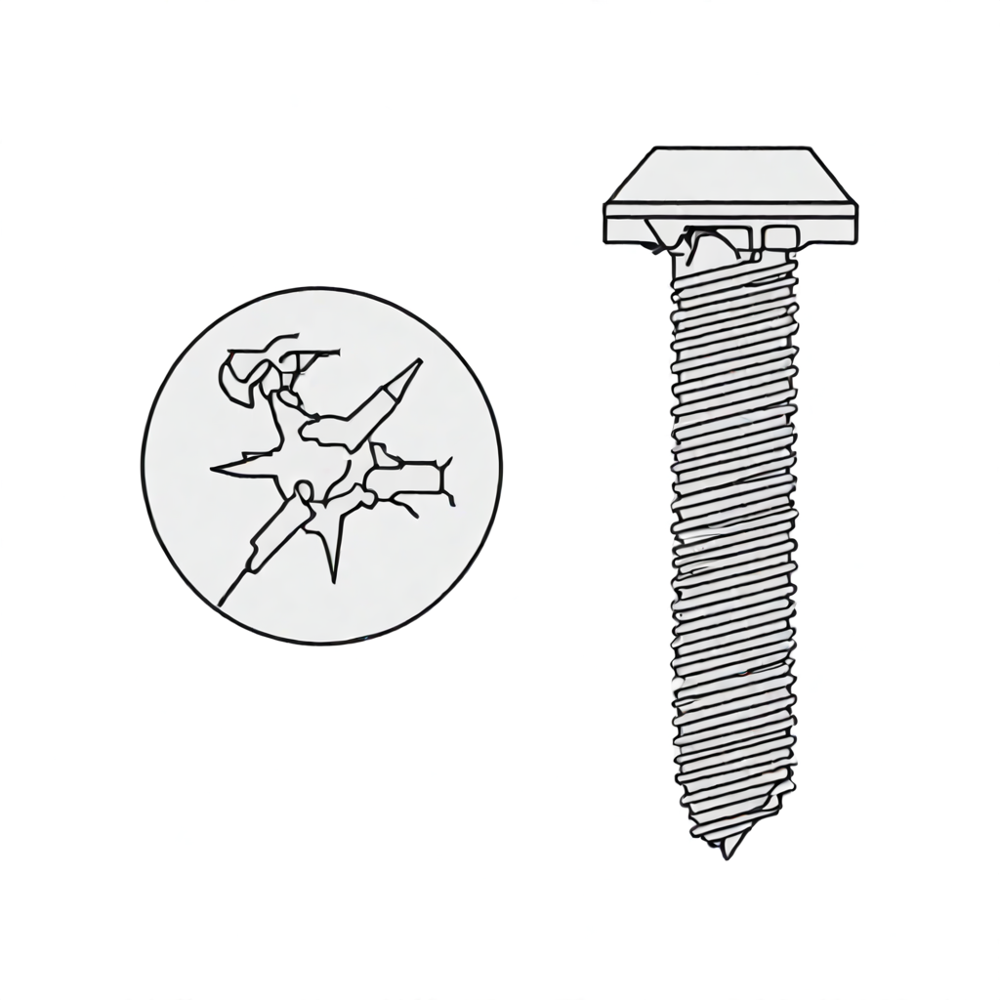

steps: 100 None


In [16]:
# Move the pipeline to GPU
_ = pipe.to("cuda")

for steps in [10, 20, 60, 100]:
  # Generate an image using the loaded model
  prompt = "a phillips head screw icon"
  num_images=1
  image = pipe(prompt, num_inference_steps= steps).images[0]
  print(f'steps: {steps}', display(image))


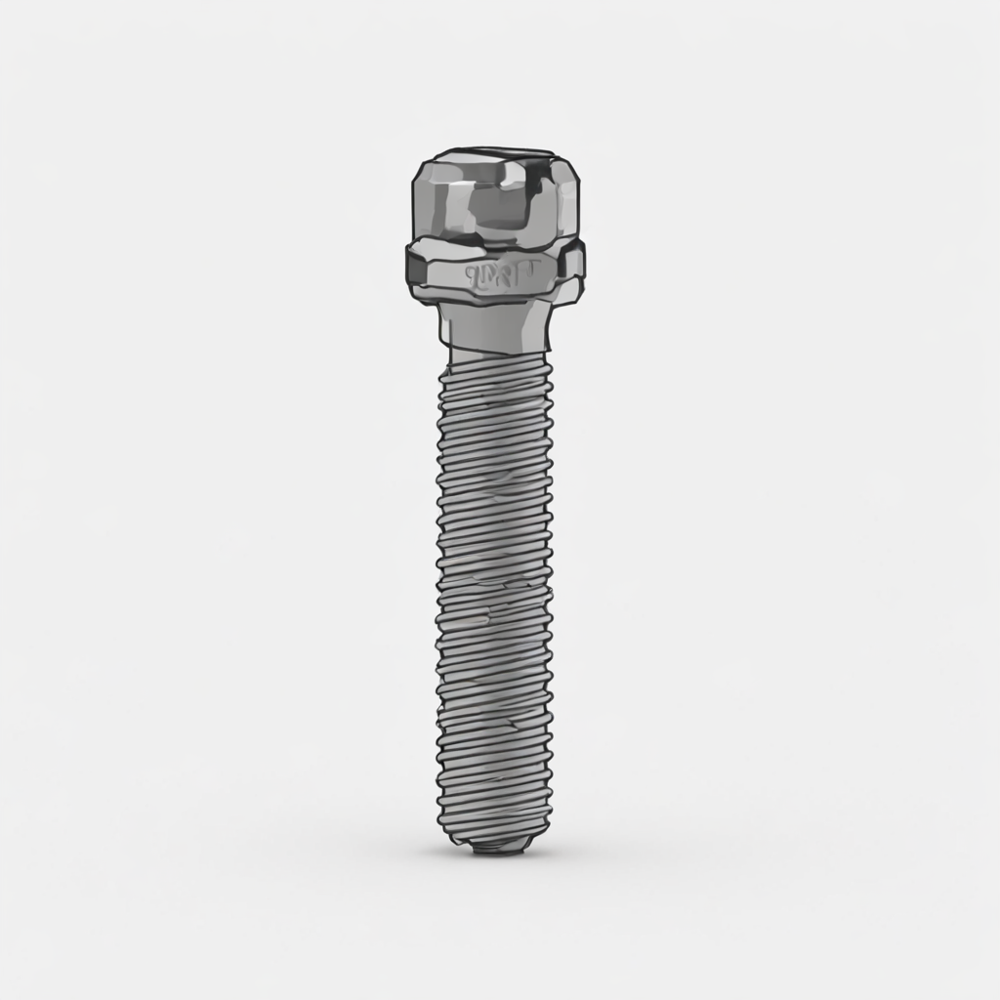

In [5]:
image

a phillips screw icon


  0%|          | 0/125 [00:00<?, ?it/s]

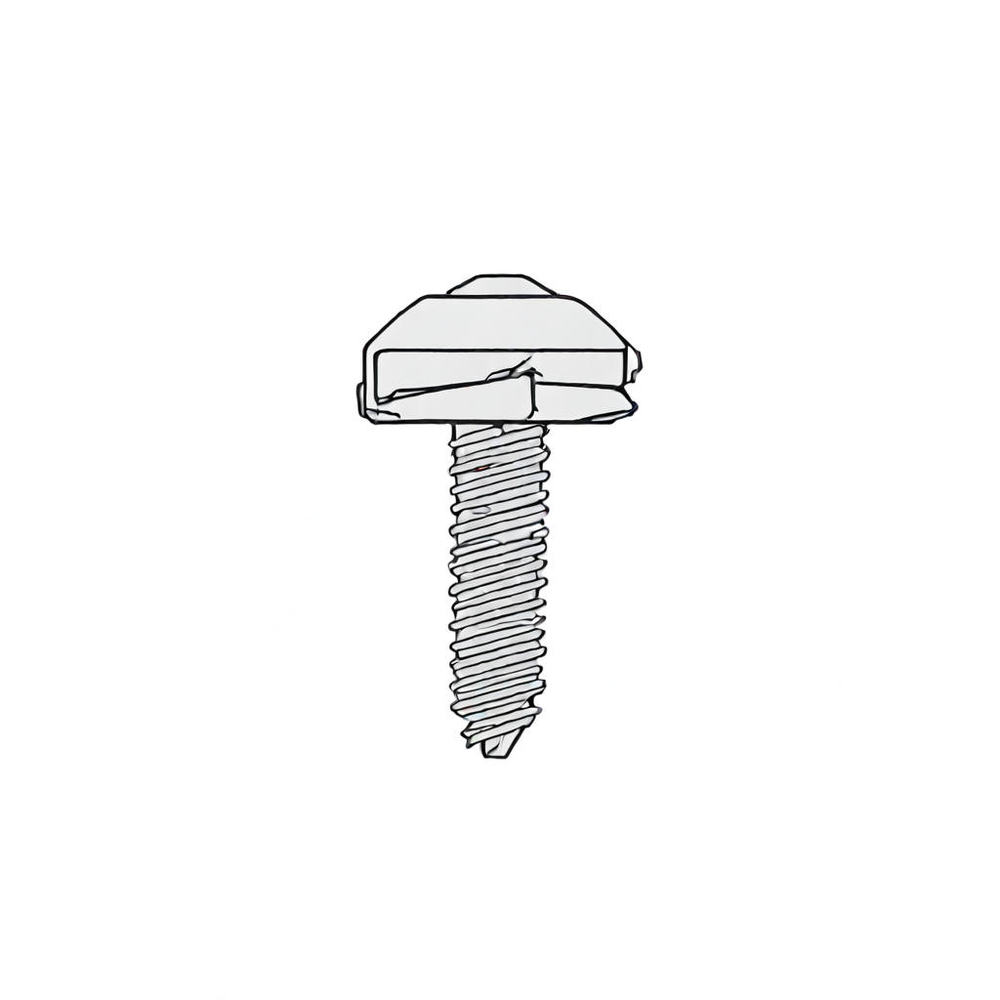

a 6 lobe screw icon


  0%|          | 0/125 [00:00<?, ?it/s]

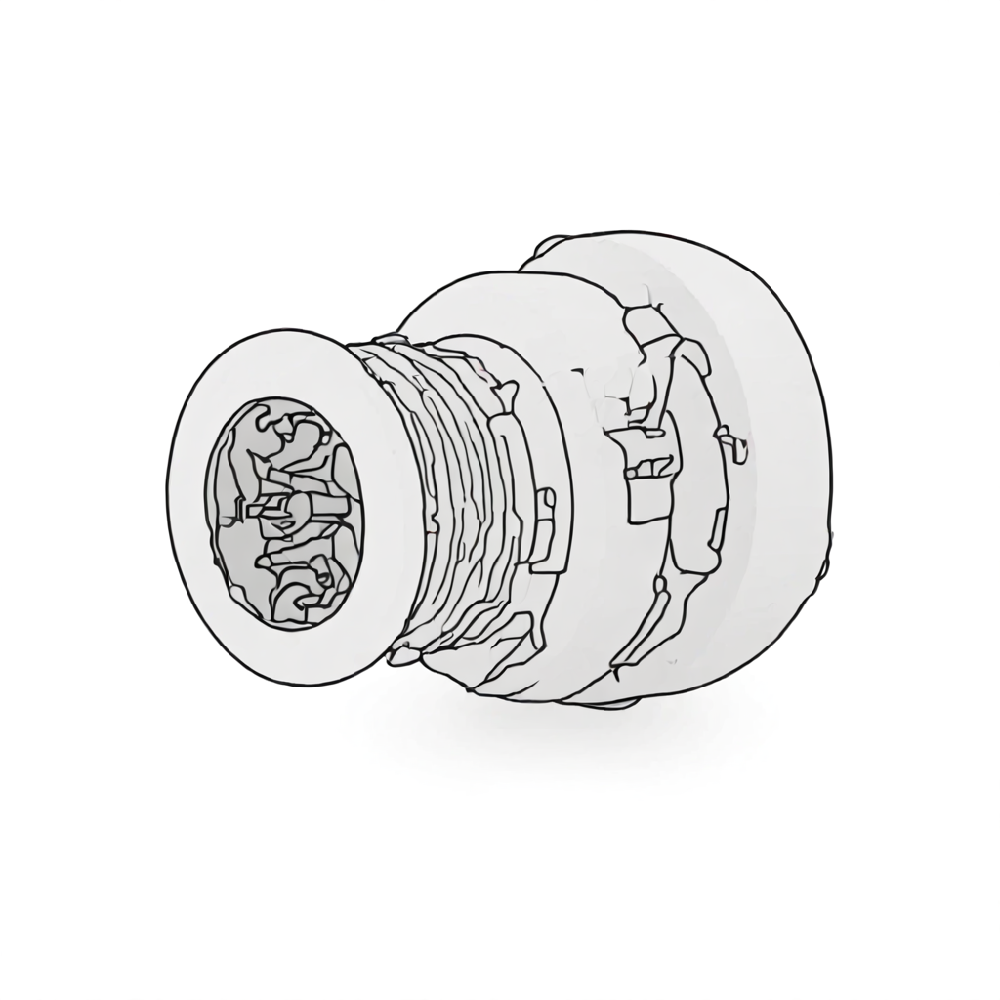

a double ended screw icon


  0%|          | 0/125 [00:00<?, ?it/s]

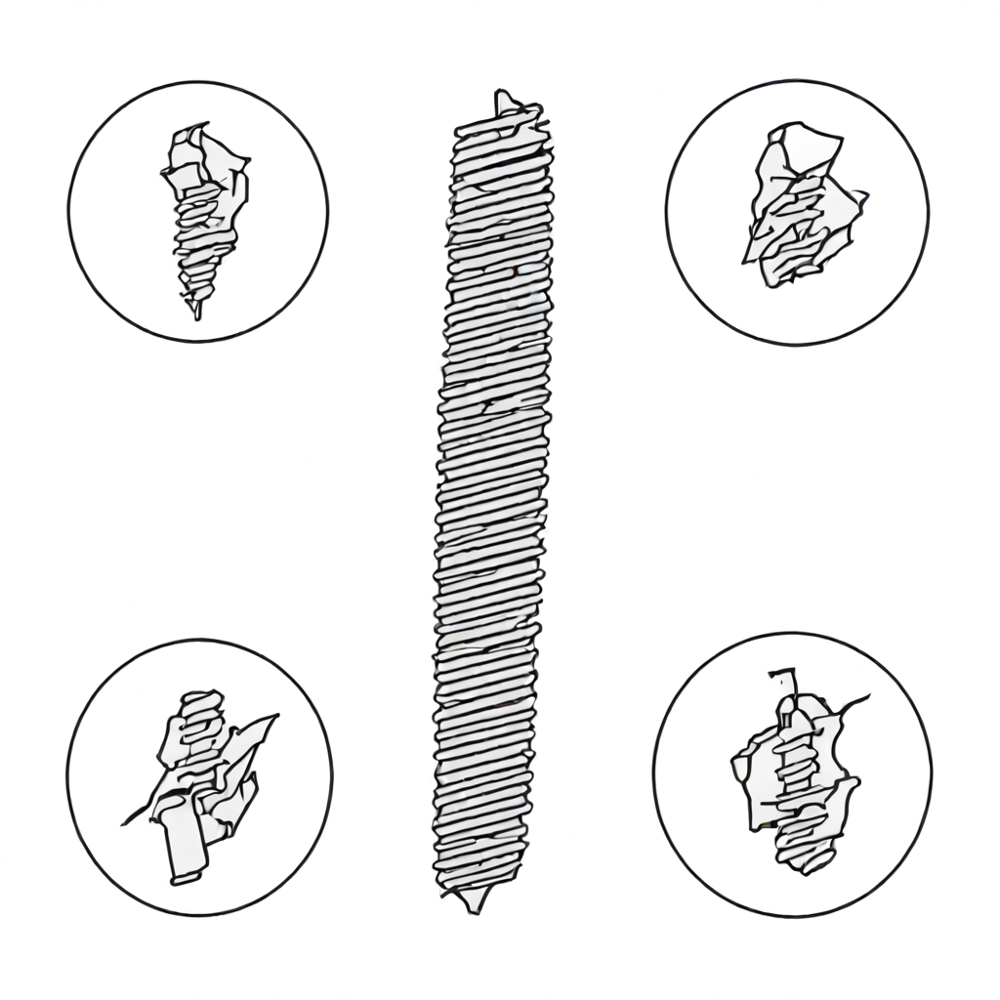

a external hex screw icon


  0%|          | 0/125 [00:00<?, ?it/s]

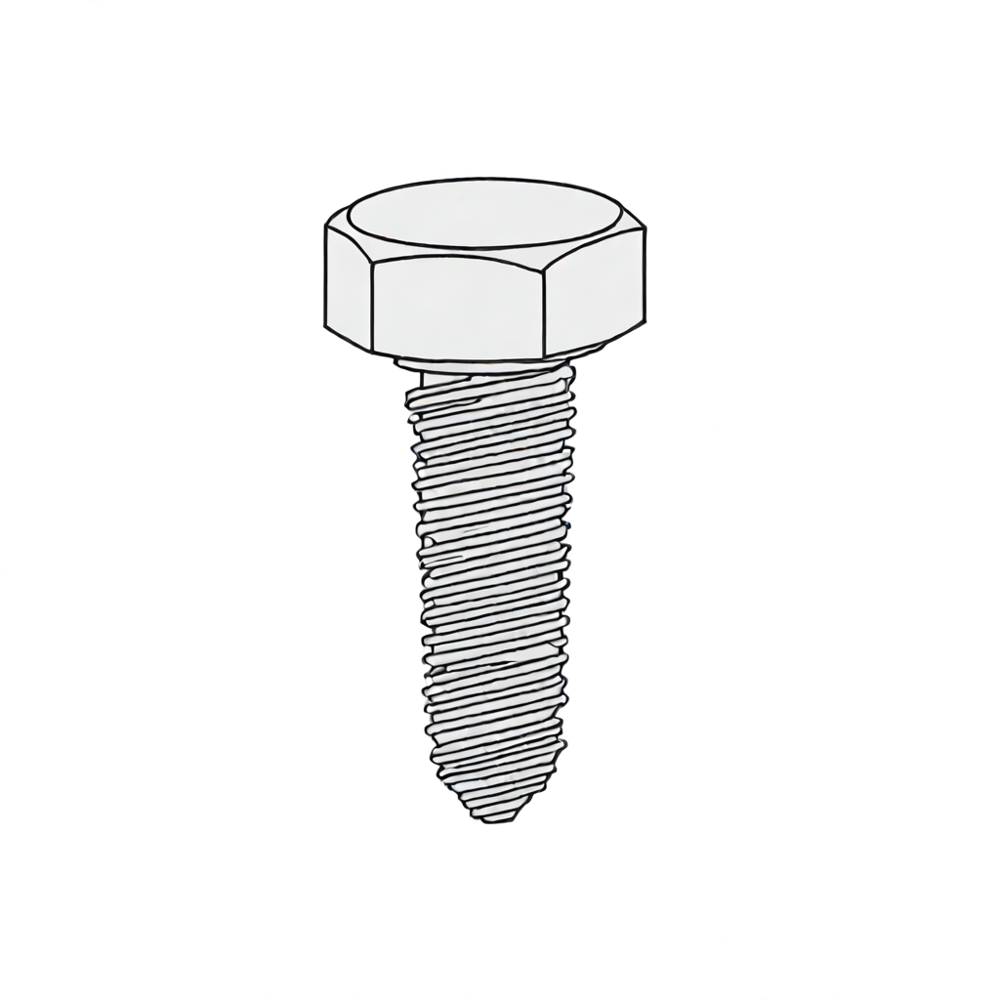

a external square screw icon


  0%|          | 0/125 [00:00<?, ?it/s]

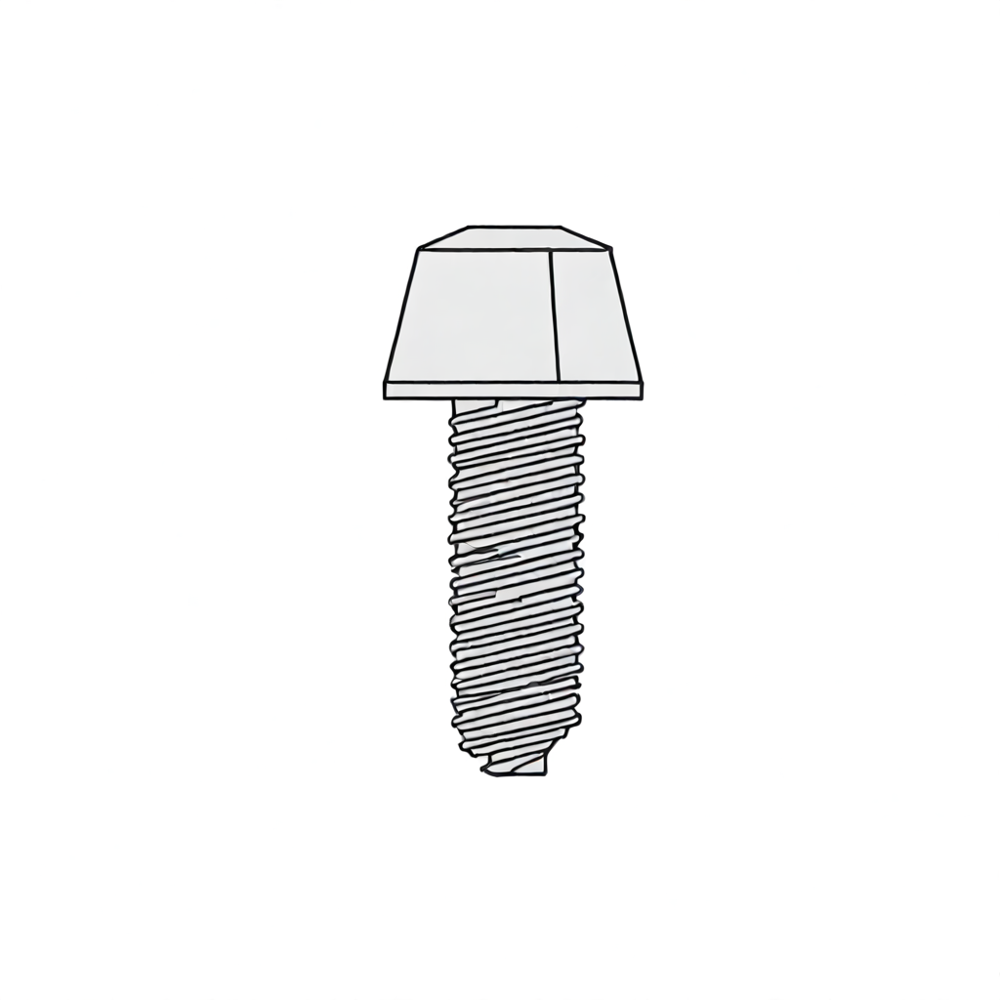

a hex screw icon


  0%|          | 0/125 [00:00<?, ?it/s]

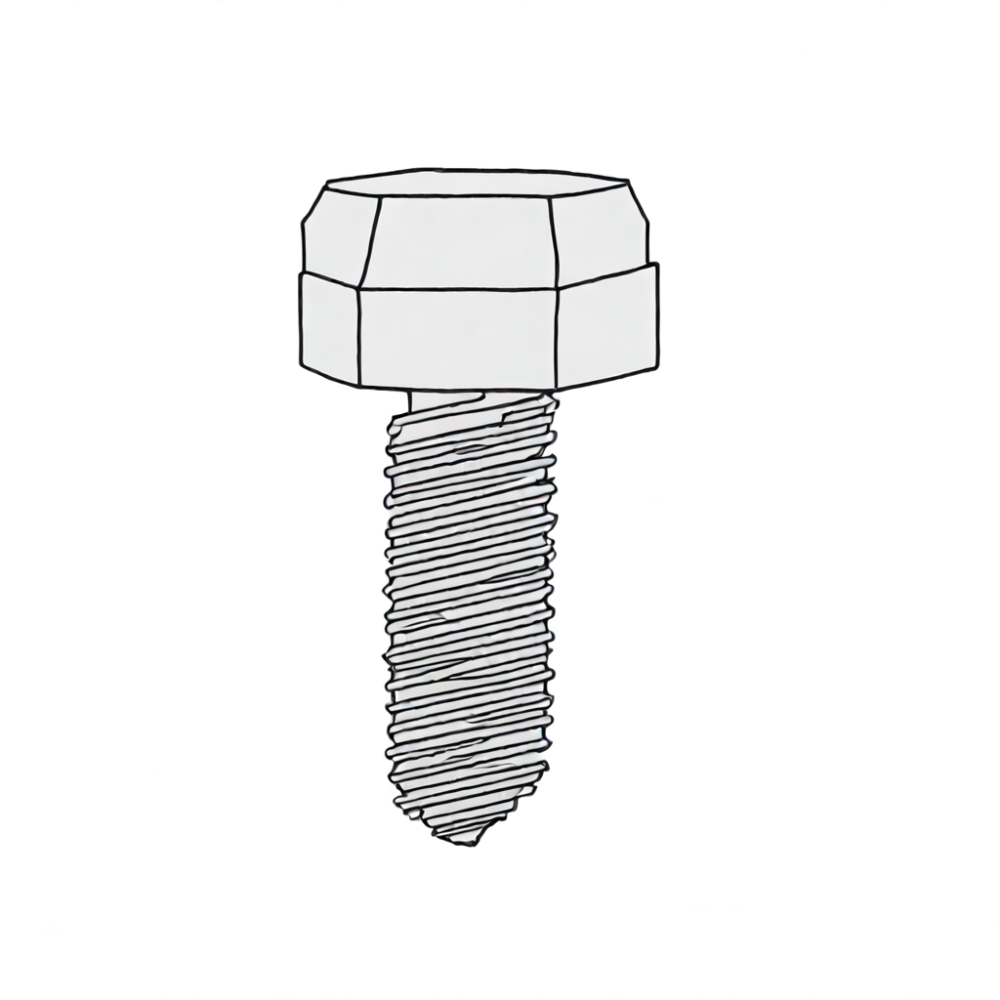

a internal hex screw icon


  0%|          | 0/125 [00:00<?, ?it/s]

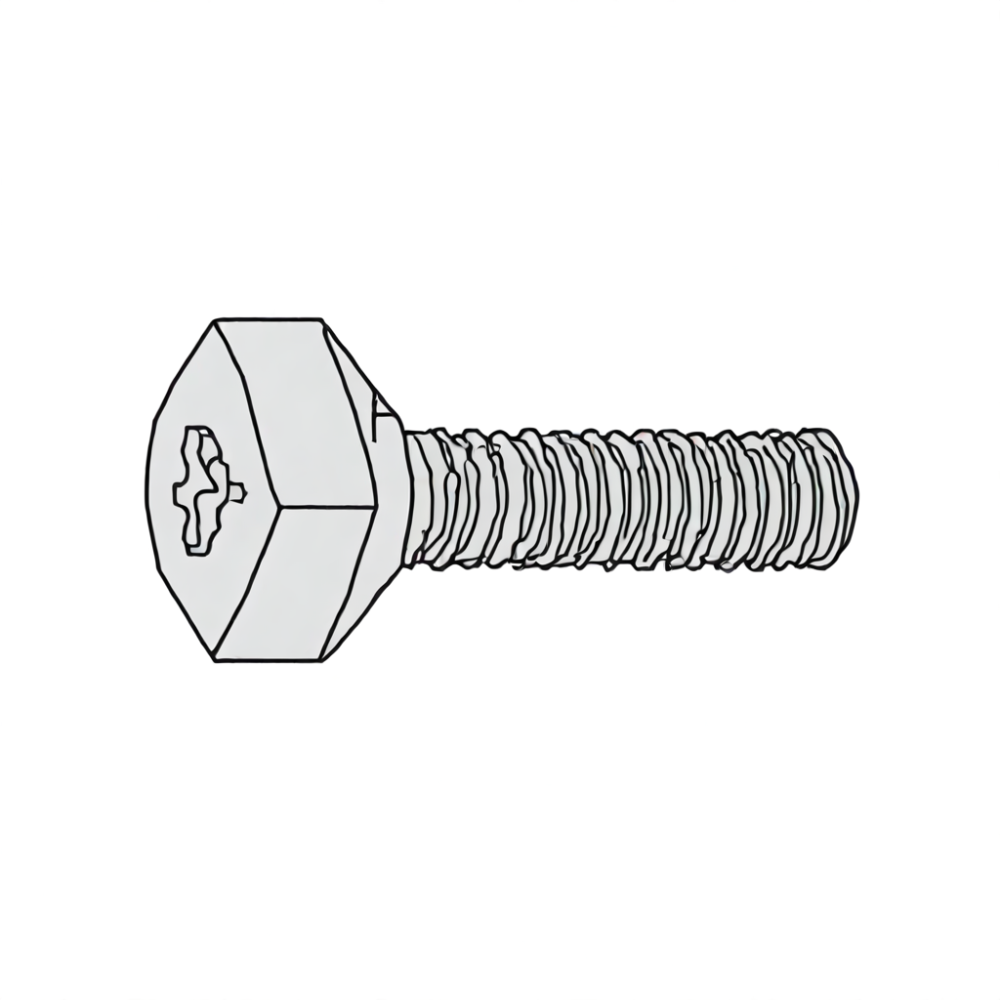

a lox screw icon


  0%|          | 0/125 [00:00<?, ?it/s]

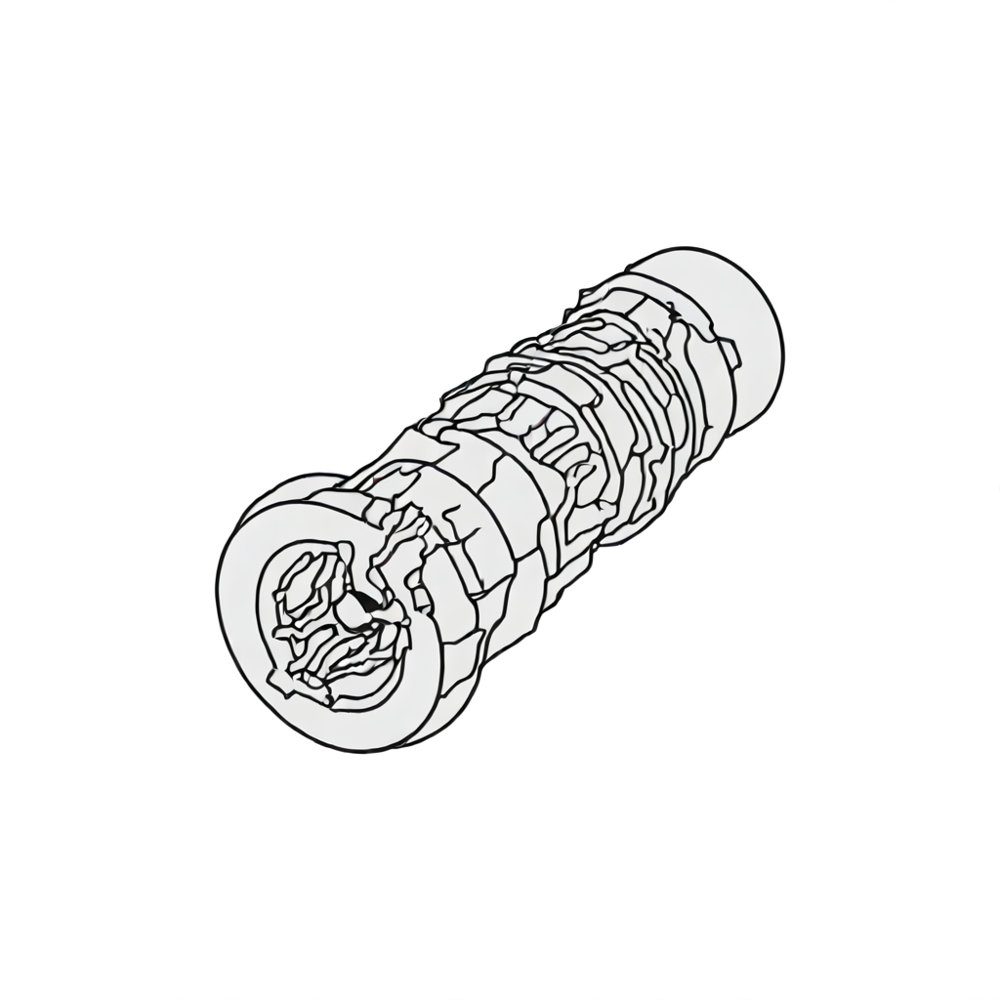

a phillips screw icon


  0%|          | 0/125 [00:00<?, ?it/s]

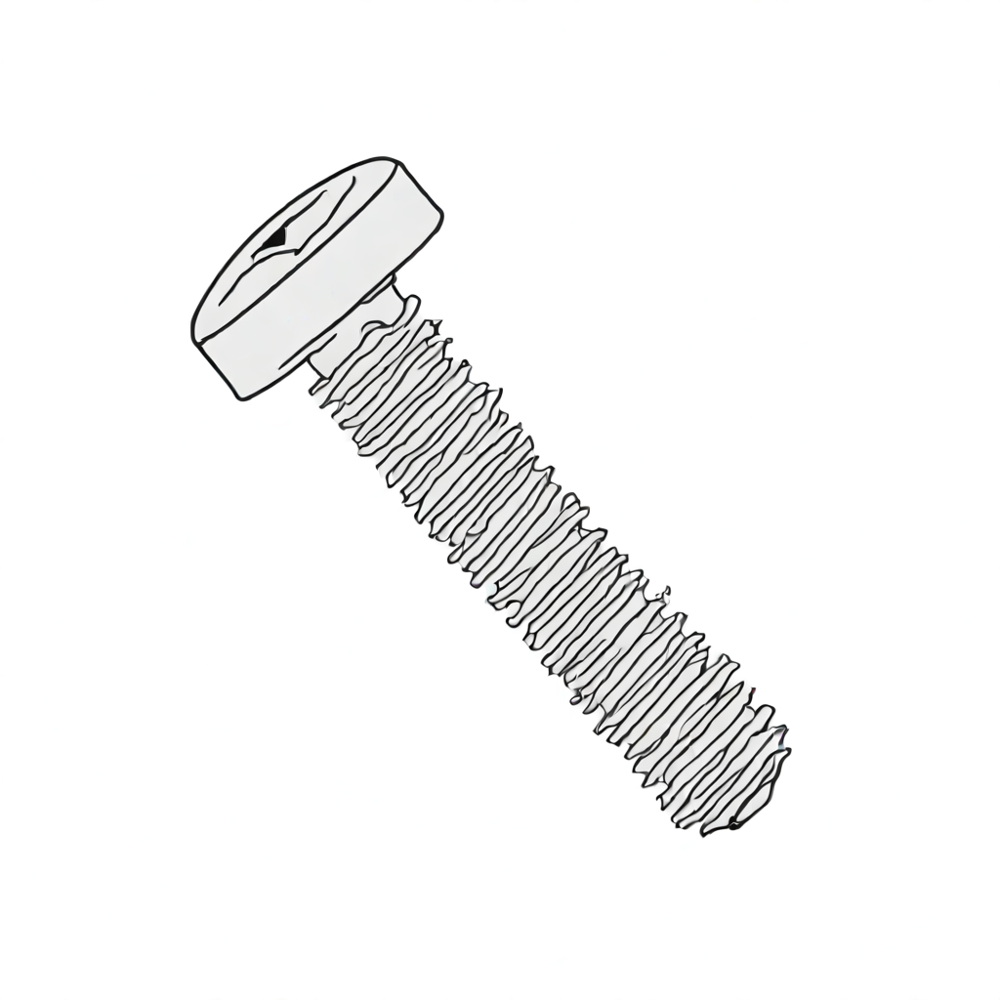

a phillips slotted screw icon


  0%|          | 0/125 [00:00<?, ?it/s]

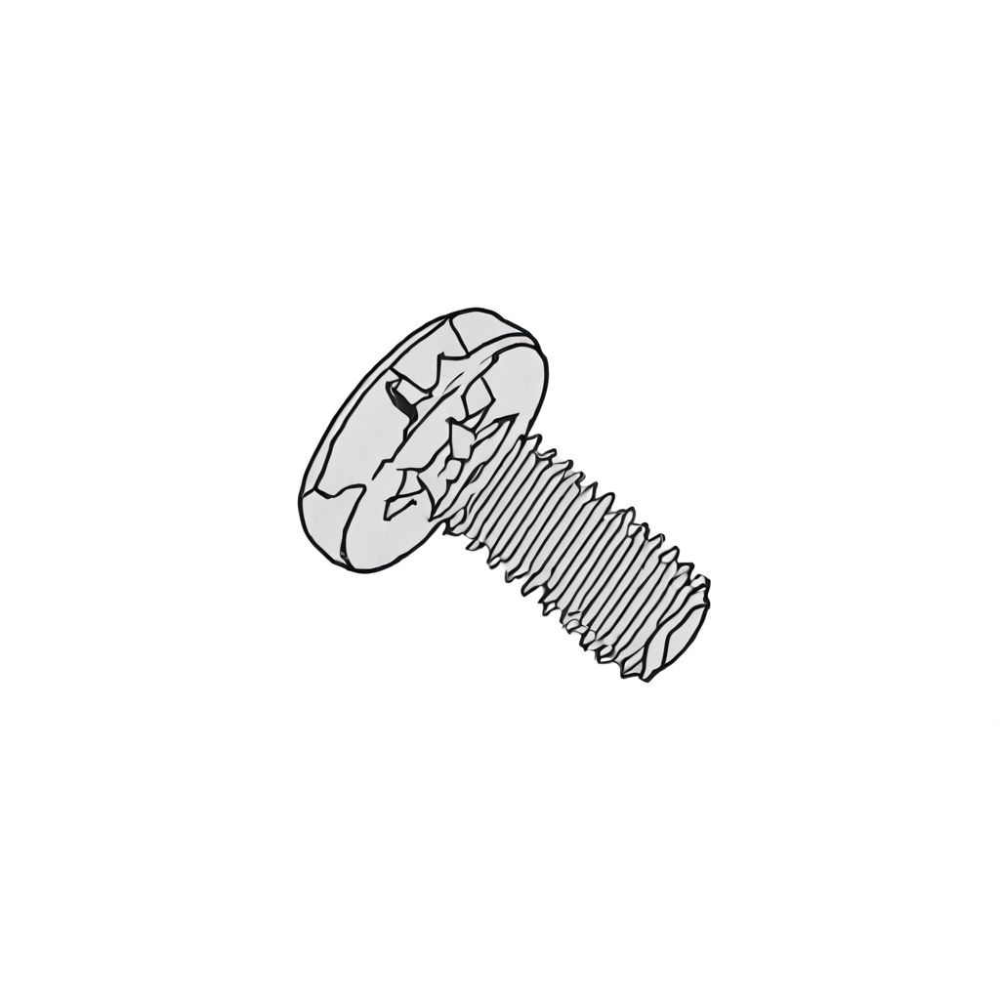

a phillips square screw icon


  0%|          | 0/125 [00:00<?, ?it/s]

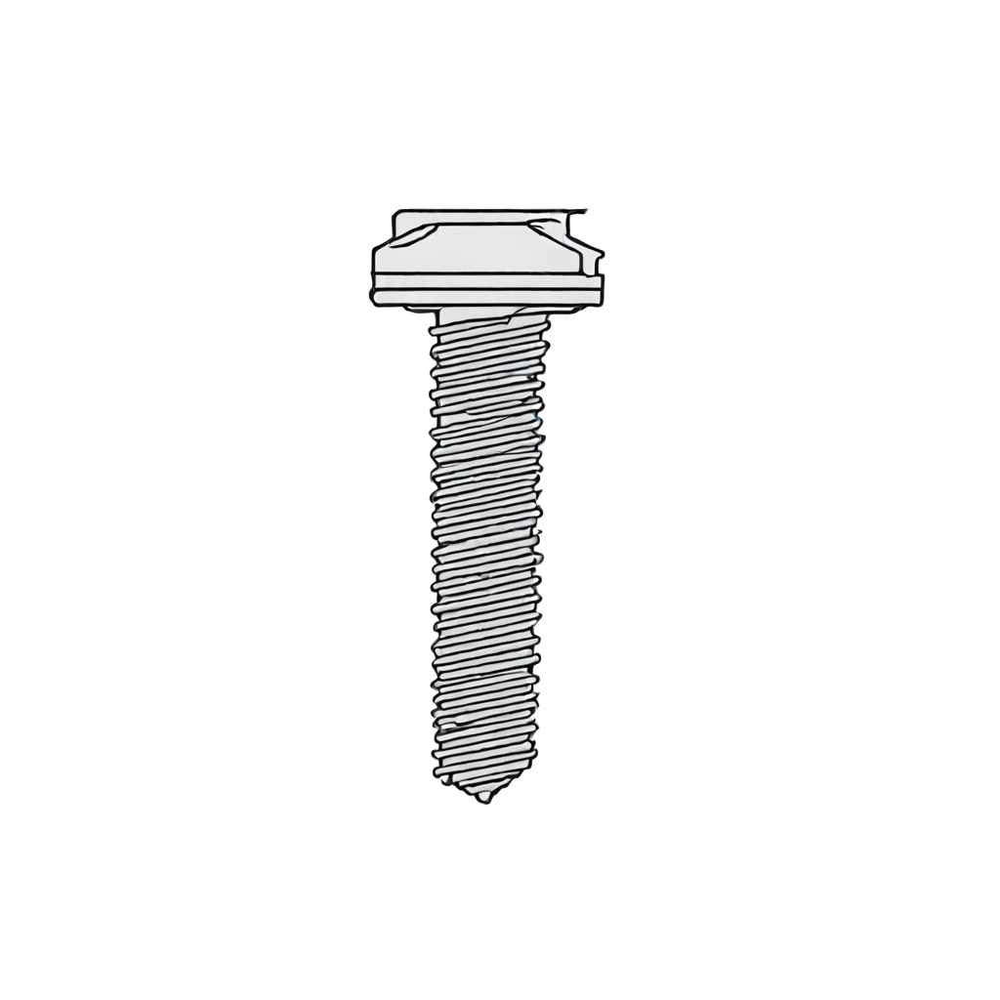

a pin in star screw icon


  0%|          | 0/125 [00:00<?, ?it/s]

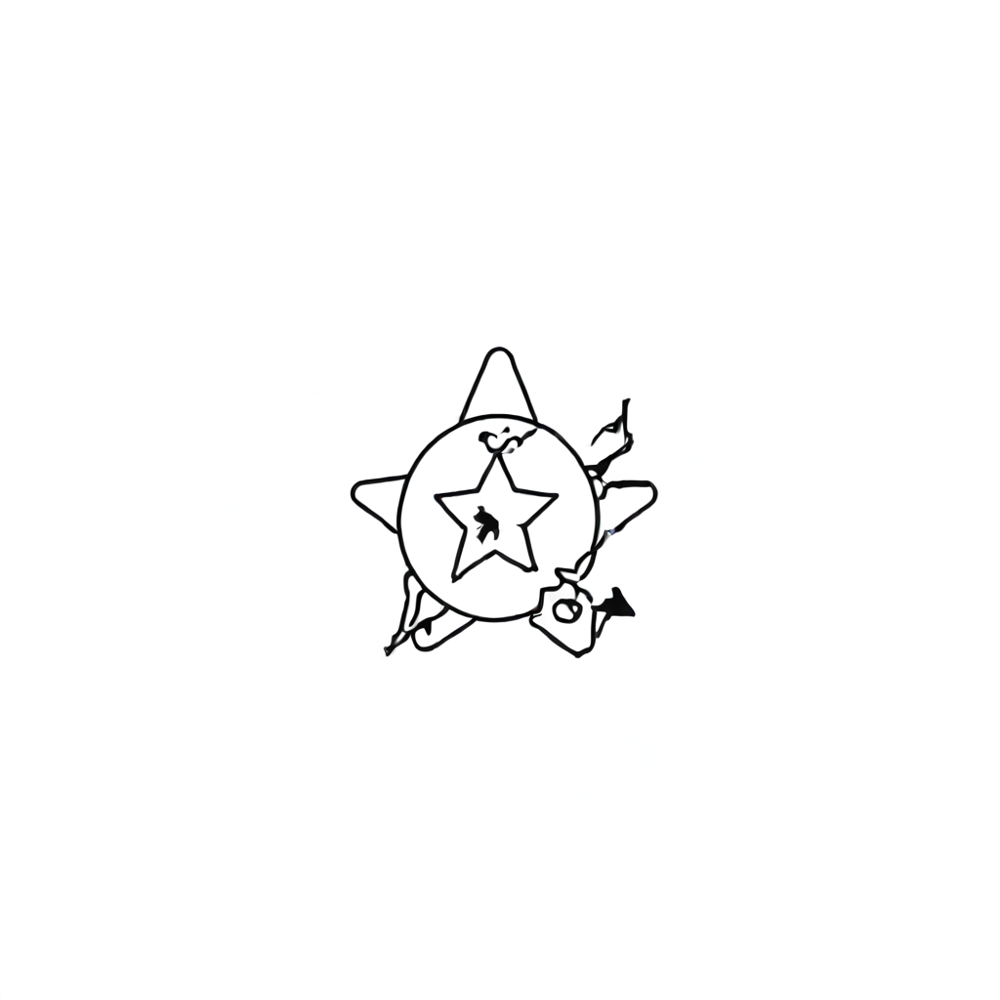

a security torx screw icon


  0%|          | 0/125 [00:00<?, ?it/s]

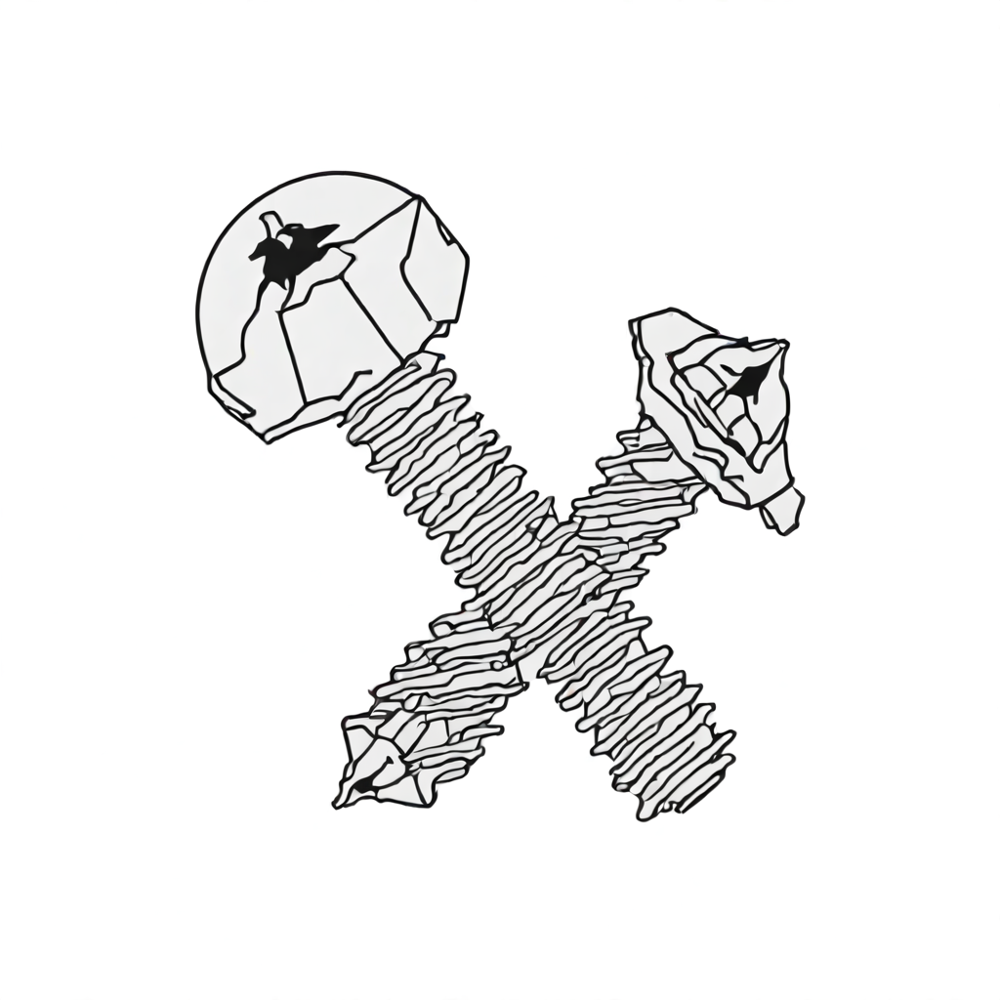

a slotted screw icon


  0%|          | 0/125 [00:00<?, ?it/s]

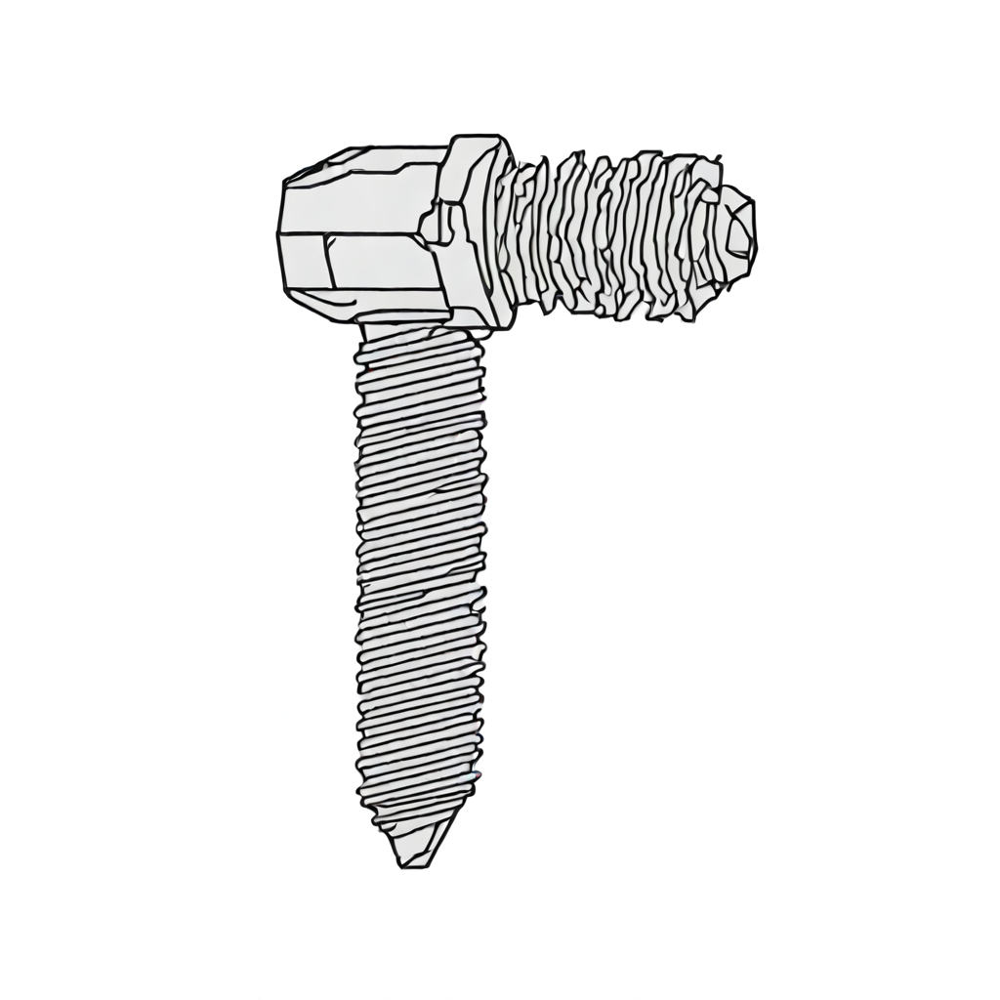

a t star plus screw icon


  0%|          | 0/125 [00:00<?, ?it/s]

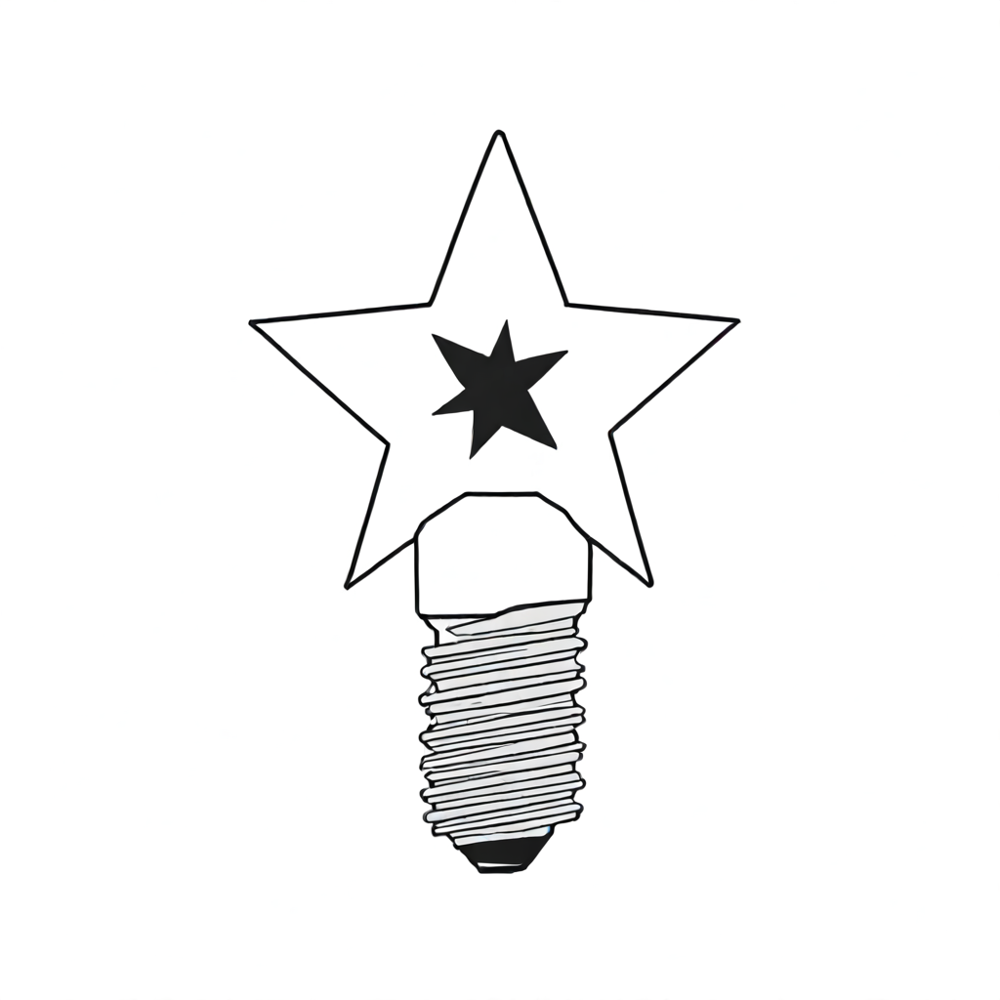

a tri wing screw icon


  0%|          | 0/125 [00:00<?, ?it/s]

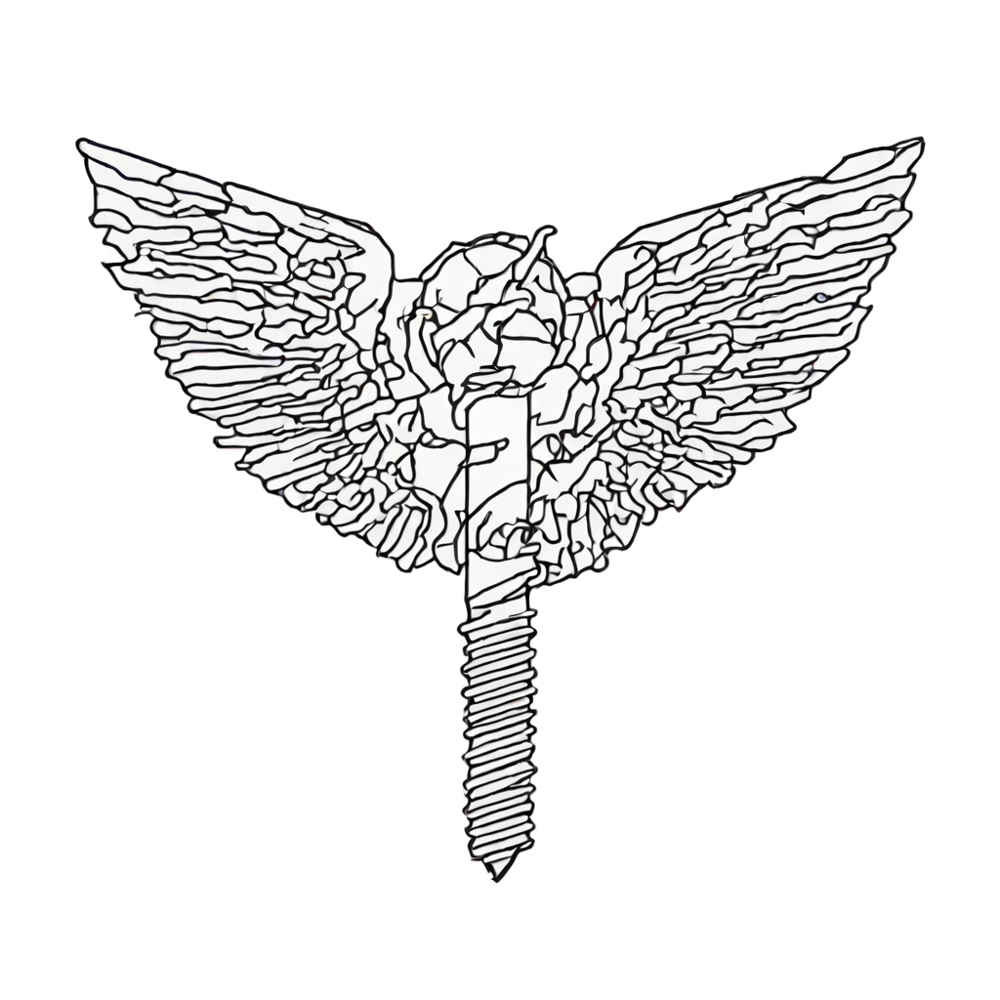

a screw cover screw icon


  0%|          | 0/125 [00:00<?, ?it/s]

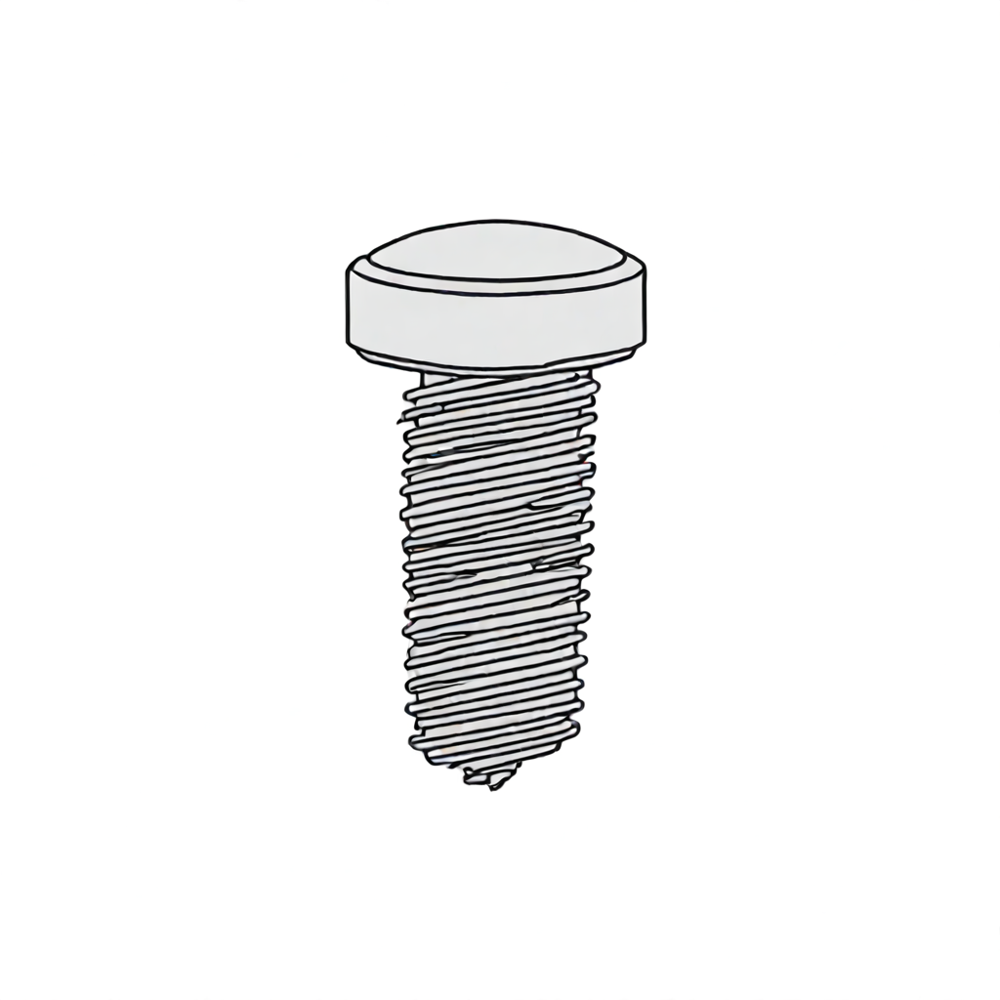

a  screw icon


  0%|          | 0/125 [00:00<?, ?it/s]

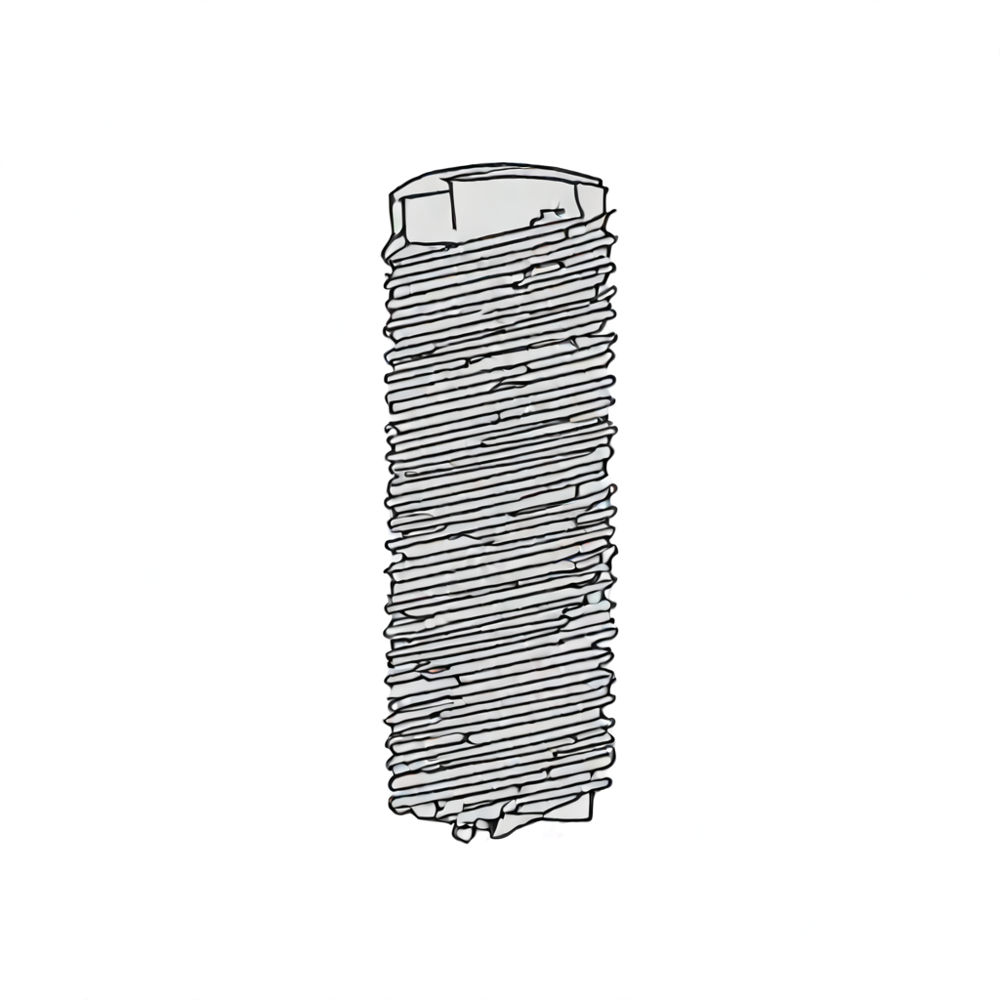

a drilling screw icon


  0%|          | 0/125 [00:00<?, ?it/s]

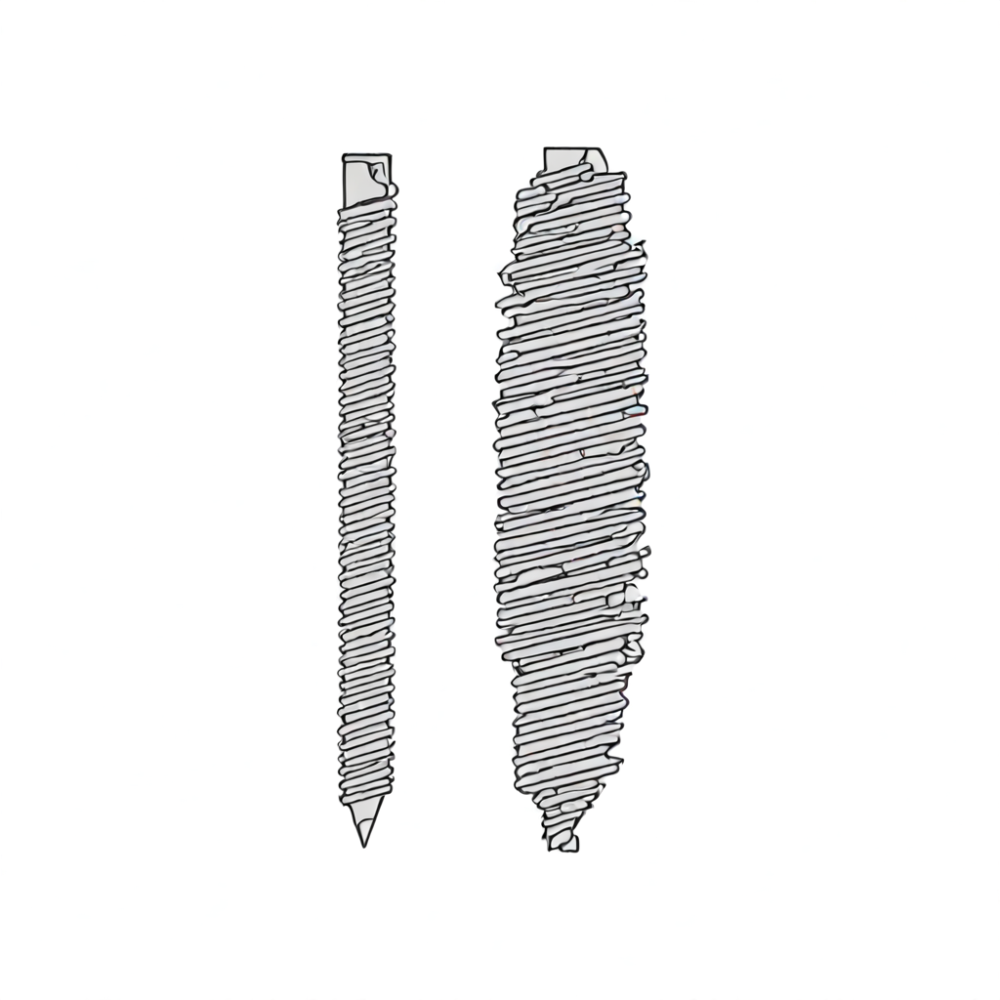

a tapping screw icon


  0%|          | 0/125 [00:00<?, ?it/s]

In [ ]:
queries = ['a phillips screw icon',
 'a 6 lobe screw icon',
 'a double ended screw icon',
 'a external hex screw icon',
 'a external square screw icon',
 'a hex screw icon',
 'a internal hex screw icon',
 'a lox screw icon',
 'a phillips screw icon',
 'a phillips slotted screw icon',
 'a phillips square screw icon',
 'a pin in star screw icon',
 'a security torx screw icon',
 'a slotted screw icon',
 'a t star plus screw icon',
 'a tri wing screw icon',
 'a screw cover screw icon',
 'a  screw icon',
 'a drilling screw icon',
 'a tapping screw icon',
 'a edges screw icon',
 'a resistant screw icon',
 'a flat screw icon',
 'a binding screw icon',
 'a dowel screw icon',
 'a fillister head screw icon',
 'a flange hex screw icon',
 'a flat undercut screw icon',
 'a hex screw icon',
 'a knurled screw icon',
 'a low profile head screw icon',
 'a low profile washer screw icon',
 'a modified truss screw icon',
 'a oval screw icon',
 'a pan head screw icon',
 'a pancake head screw icon',
 'a round head screw icon',
 'a spade screw icon',
 'a square head screw icon',
 'a trim screw icon',
 'a truss screw icon',
 'a truss head screw icon',
 'a wafer head screw icon',
 'a washer head screw icon',
 'a wing screw icon',
 'a indoor outdoor screw icon',
 'a exterior screw icon',
 'a interior screw icon',
 'a size screw icon',
 'a serrated flange hex screw icon']

for query in queries:
    # Move the pipeline to GPU
  _ = pipe.to("cuda")

  # Generate an image using the loaded model
  prompt = query
  num_images=1
  print(query)
  image = pipe(prompt, num_inference_steps= 125).images[0]
  display(image)
